# Project - Plant Seedlings Image Classification using CNNs

**Data Description:**

You are provided with a dataset of images of plant seedlings at various stages of growth. Each image has a filename that is its
unique id. The dataset comprises 12 plant species. The goal of the project is to create a classifier capable of determining a plant's
species from a photo.

**Context:**

Can you differentiate a weed from a crop seedling?
The ability to do so effectively can mean better crop yields and better stewardship of the environment.
The Aarhus University Signal Processing group, in collaboration with University of Southern Denmark, has
recently released a dataset containing images of unique plants belonging to 12 species at several growth stages.

# 1. Libraries, Reading Data and Visualizing Images

**Importing the necessary libraries**

In [ ]:
# Libraries for manipulating numbers, datasets and displaying graphs/images
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Libraries for splitting the data into training and test and displaying model performance
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

# Libraries for building the CNN
from tensorflow.keras.models import Sequential                                                    # Basic wrapper to build model inside
from tensorflow.keras.layers import Dense, Dropout                                                # Dense layer is for the ANN last bit of the CNN, Dropout used to control overfitting
from tensorflow.keras.layers import Conv2D, MaxPooling2D, AveragePooling2D, BatchNormalization    # CNN layers
from tensorflow.keras.layers import GlobalMaxPooling2D, GlobalAveragePooling2D, Flatten           # Layers to transform the data when passing from the CNN to the ANN
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping                             # Used to control overfitting and store the best model during the epochs of training
from tensorflow.keras import backend                                                              # Used to clear memory (RAM)

# Seeding the random number generator to ensure the model building process is repeatable
import random
random.seed(0)  # The number zero is not special, basically any integer works

# Libary containing Gaussian Blurring
import cv2

# Command for the notebook to display graphs (in this case images) in the notebook
%matplotlib inline

**Connecting to Google Drive**

In [ ]:
from google.colab import drive    # Libary to access the user's Google Drive folders and files
drive.mount("/content/drive")     # Linking to the user's Google Drive

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Reading the dataset**

In [ ]:
data = np.load("/content/drive/My Drive/AIML/7.0/Week 3 - Project/images.npy")    # Loading the images which are stored as numpy arrays
print("Data Shape:", data.shape)                                                  # Displaying the shape of the data

Data Shape: (4750, 128, 128, 3)


- From the above printout of the shape of the data there are 4750 images.
- Each image is 128 pixels wide by 128 pixels high.
- Each image is also in color, since the last size number is 3 standing for RGB.

**Reading the Image Labels**

In [ ]:
labels = pd.read_csv("/content/drive/My Drive/AIML/7.0/Week 3 - Project/Labels.csv")  # Loading the image labels which are stored in a csv file
print("Label Shape:", labels.shape)                                                   # Displaying the shape of the labels

Label Shape: (4750, 1)


- From the above printout of the shape of the labels there are 4750 images.

In [ ]:
labels.head()  # Showing the first five labels

,Label
0,Small-flowered Cranesbill
1,Small-flowered Cranesbill
2,Small-flowered Cranesbill
3,Small-flowered Cranesbill
4,Small-flowered Cranesbill


In [ ]:
# Printing the number of different seedlings in the dataset
print("Number of unique classes:", labels.nunique())

# Displaying the names of the seedlings and how many of each type there are
valueCounts = pd.DataFrame(labels.value_counts(), columns=["Count"])          # Column for how many of each type of seedling
valueCounts["Percent"] = np.round(labels.value_counts(normalize=True)*100)    # Column for the percentage of each type of seedling with respect to the whole dataset
valueCounts

Number of unique classes: Label    12
dtype: int64


,Count,Percent
Label,,
Loose Silky-bent,654,14.0
Common Chickweed,611,13.0
Scentless Mayweed,516,11.0
Small-flowered Cranesbill,496,10.0
Fat Hen,475,10.0
Charlock,390,8.0
Sugar beet,385,8.0
Cleavers,287,6.0
Black-grass,263,6.0


- The dataset is not balanced as there are some classes with almost triple the frequency of others.
- The dataset contains 12 different types of seedlings.

## Visualizing the Seedlings

**Custom function to visualize 4 seedlings at one time**

In [ ]:
# Custom function to visualize 4 seedlings at one time
# Input is the name of a seedling
def showPlants(seedlingName):
  currentPlantIdx = labels[labels["Label"] == seedlingName].index   # Finds the indices of all images with the input seedling name
  currentPlantImage = data[currentPlantIdx[0:4]]                    # Grabs only the first four images with for this seedling
  
  fig, axs = plt.subplots(1, 4)                                     # Initializing the subplots for the 4 images

  fig.set_figheight(20)                                             # Controlling the display size of the images
  fig.set_figwidth(20)

  axs[0].imshow(currentPlantImage[0])                               # Plotting the first image
  axs[1].imshow(currentPlantImage[1])                               # Plotting the second image
  axs[2].imshow(currentPlantImage[2])                               # Plotting the third image
  axs[3].imshow(currentPlantImage[3])                               # Plotting the fourth image

  fig.tight_layout = True                                           # Better margins for displaying multiple graphs
  plt.show()

**Visualizing Loose Silky-bent**

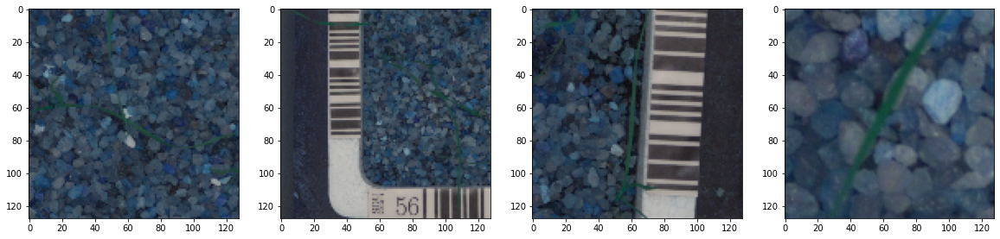

In [ ]:
showPlants("Loose Silky-bent")

**Visualizing Common Chickweed**

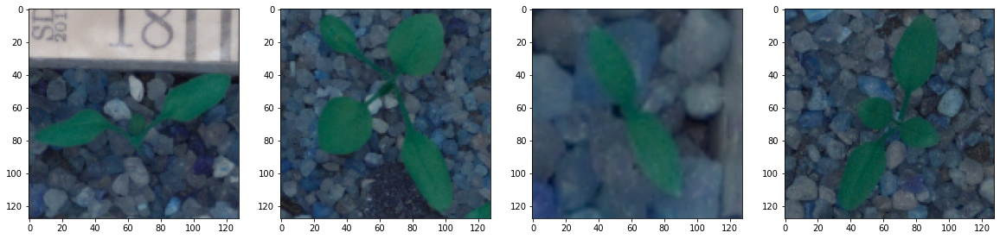

In [ ]:
showPlants("Common Chickweed")

**Visualizing Scentless Mayweed** 

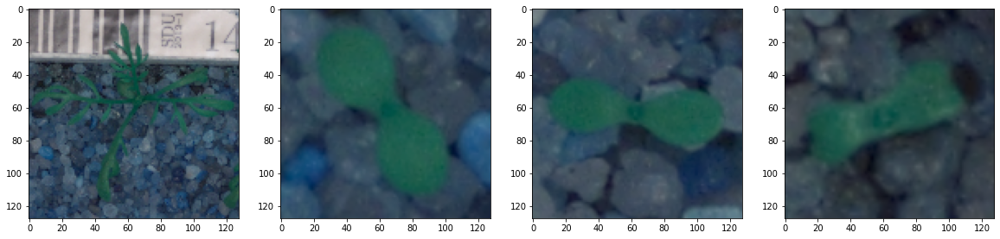

In [ ]:
showPlants("Scentless Mayweed")

**Visualizing Small-flowered Cranesbill**

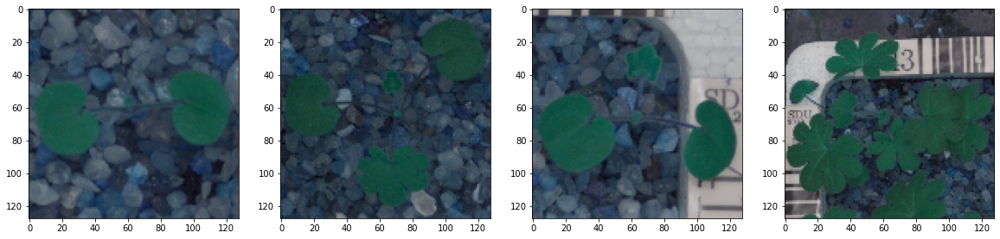

In [ ]:
showPlants("Small-flowered Cranesbill")

**Visualizing Fat Hen**

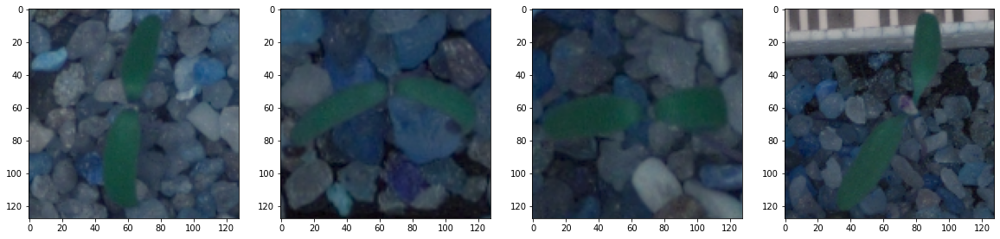

In [ ]:
showPlants("Fat Hen")

**Visualizing Charlock**

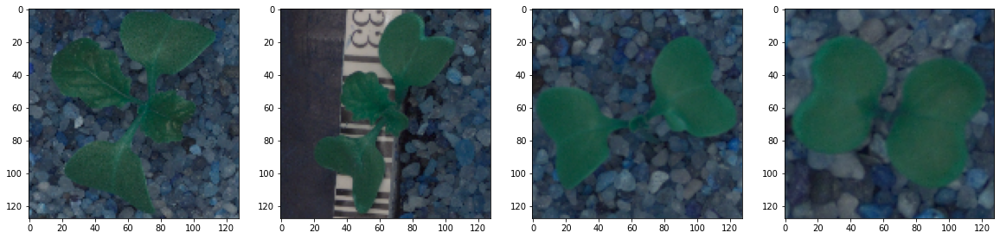

In [ ]:
showPlants("Charlock")

**Visualizing Sugar beet**

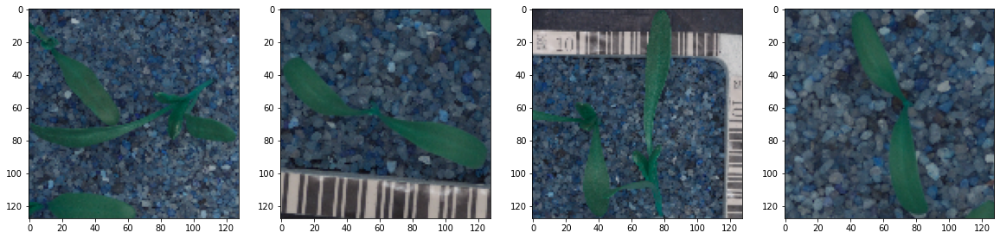

In [ ]:
showPlants("Sugar beet")

**Visualizing Cleavers**

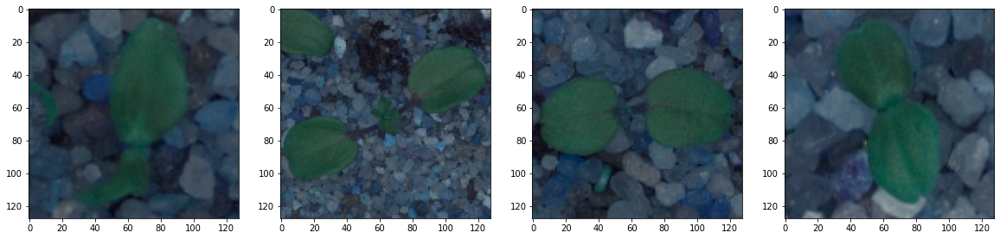

In [ ]:
showPlants("Cleavers")

**Visualizing Black-grass**

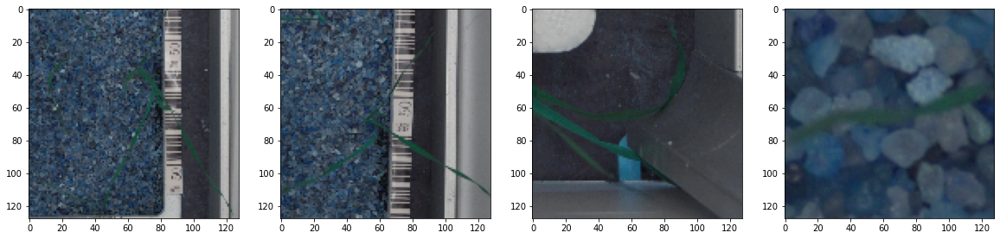

In [ ]:
showPlants("Black-grass")

**Visualizing Shepherds Purse**

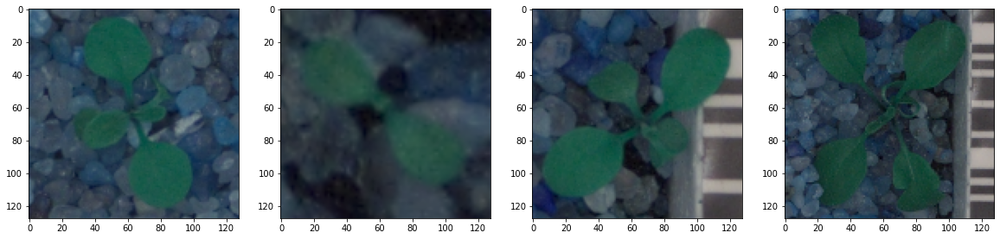

In [ ]:
showPlants("Shepherds Purse")

**Visualizing Maize**

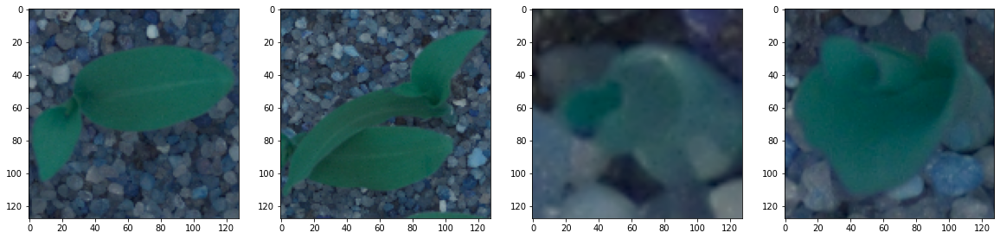

In [ ]:
showPlants("Maize")

**Visualizing Common wheat**

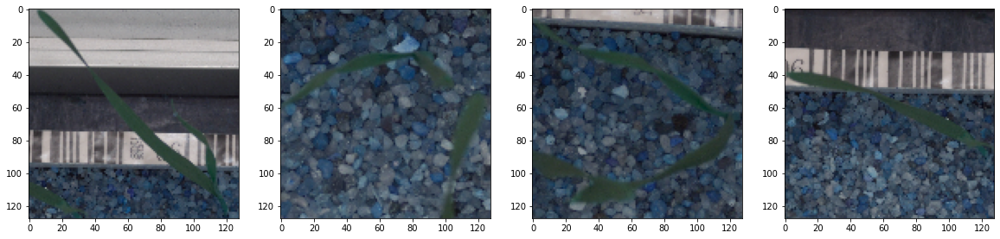

In [ ]:
showPlants("Common wheat")

- The dataset contains images that include rocks, barcodes/rulers and other things in the background.
- Many of the plants, such as Black Grass and Loose Silky-bent are very similar to one another.
  - The model should easily be able to distiguish Maize from Black Grass, but others it may struggle with.

# 2. Data Pre-processing

## Normalization

Each image is made of pixels containing integers ranging from 0 to 255 for each color.  Since neural networks perform better on normalized data, we will divide these pixel values by 255 so the values range from 0 to 1.

In [ ]:
data = data/255.0                 # Normalizing data by dividing pixel values by 255 (max that any value can be)
print("Min Value:", data.min())   # Printing the new minimum value
print("Max Value:", data.max())   # Printing the new maximum value

Min Value: 0.0
Max Value: 1.0


The above printout shows our normalization worked since all pixel values now range from 0 to 1.

## Gaussian Blurring

We will use Gaussian blurring to hopefully eliminate noise in the images.

In [ ]:
data.shape  # Printing the initial shape of the data

(4750, 128, 128, 3)

In [ ]:
blurredData = []                                                    # Initializing a list to store the blurred images in

for img in data:                                                    # Looping through each image to blur it separately
  blurredImage = cv2.GaussianBlur(src=img, ksize=(5,5), sigmaX=0)   # Blurring the image using a kernel size of 5x5
  blurredData.append(blurredImage)                                  # Storing the blurred image in the new list

In [ ]:
blurredData = np.array(blurredData)                                 # Converting the blurred images back into a numpy array for the training later

In [ ]:
blurredData.shape  # Printing the blurred data shape

(4750, 128, 128, 3)

The shape of the blurred data is the same as the original data so we are good to go.

In [ ]:
# Clearing up memory (RAM)
del data

## Visualize Data After Pre-Processing

In [ ]:
# Custom function to visualize 4 seedlings at one time
# Input is the name of a seedling
# Will also print the name of the seedling unlike before
def showPlants(seedlingName):
  currentPlantIdx = labels[labels["Label"] == seedlingName].index   # Finds the indices of all images with the input seedling name
  currentPlantImage = blurredData[currentPlantIdx[0:4]]             # Grabs only the first four images with for this seedling
  
  fig, axs = plt.subplots(1, 4)                                     # Initializing the subplots for the 4 images

  fig.set_figheight(20)                                             # Controlling the display size of the images
  fig.set_figwidth(20)

  axs[0].imshow(currentPlantImage[0])                               # Plotting the first image
  axs[1].imshow(currentPlantImage[1])                               # Plotting the second image
  axs[2].imshow(currentPlantImage[2])                               # Plotting the third image
  axs[3].imshow(currentPlantImage[3])                               # Plotting the fourth image

  fig.tight_layout = True                                           # Better margins for displaying multiple graphs

  print("***", seedlingName, "***")                                 # Printing the seedling name before the picture
  plt.show()                                                        # Printing the image
  print("\n\n")                                                     # Adding space before the next seedling

*** Small-flowered Cranesbill ***


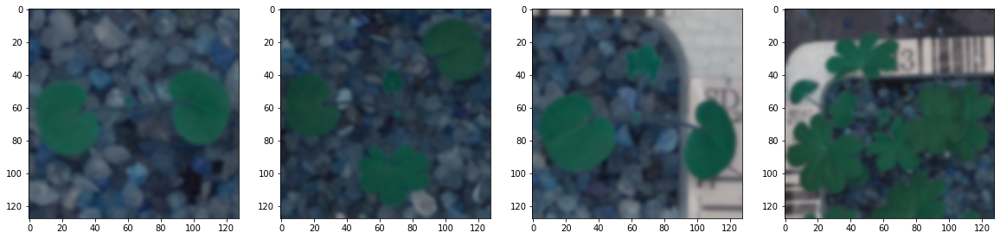




*** Fat Hen ***


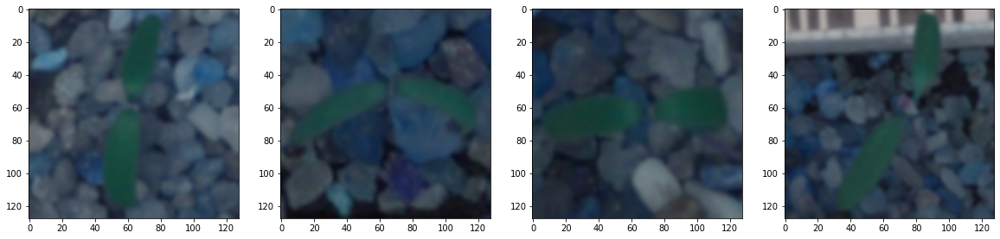




*** Shepherds Purse ***


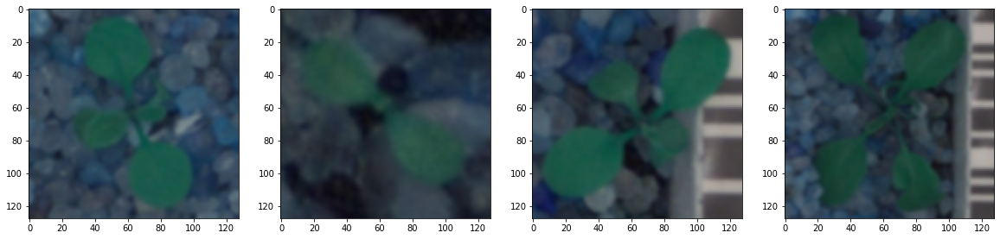




*** Common wheat ***


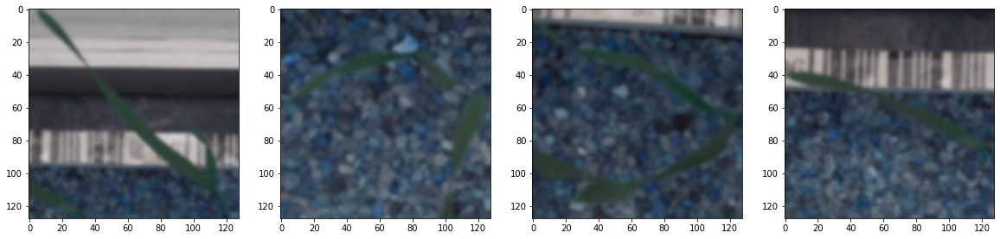




*** Common Chickweed ***


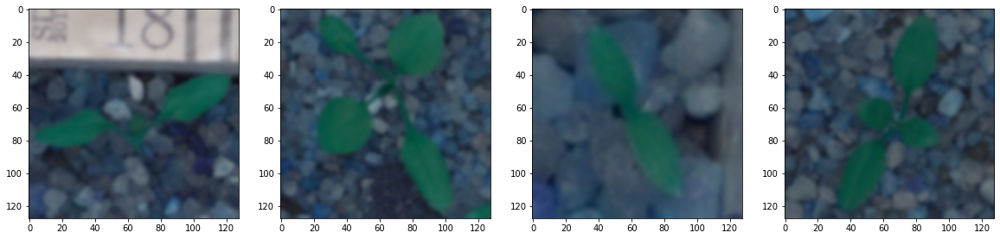




*** Charlock ***


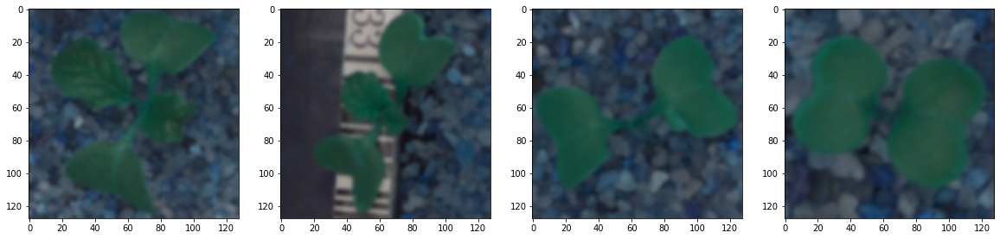




*** Cleavers ***


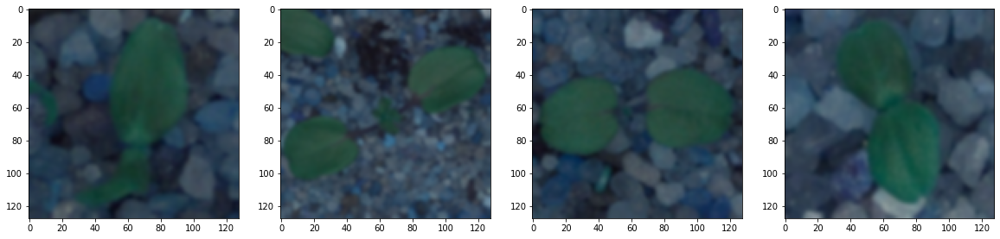




*** Scentless Mayweed ***


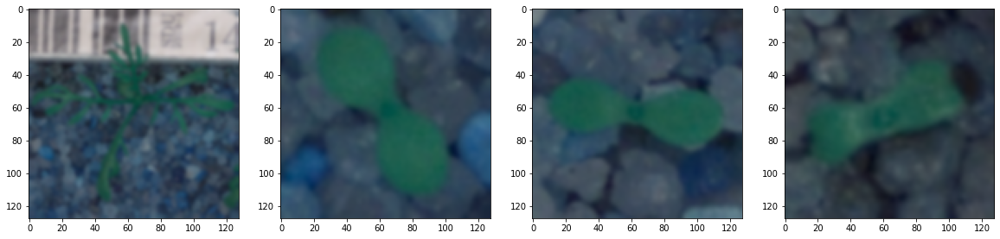




*** Sugar beet ***


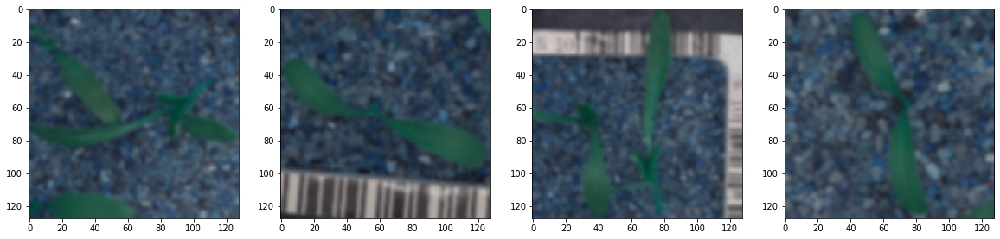




*** Maize ***


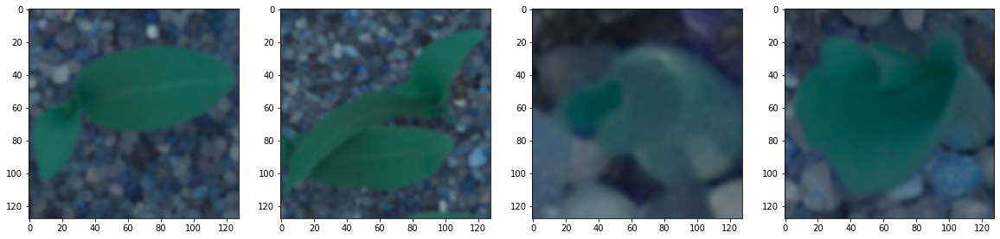




*** Black-grass ***


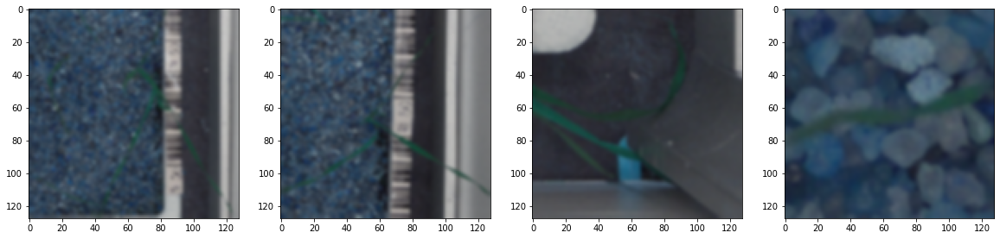




*** Loose Silky-bent ***


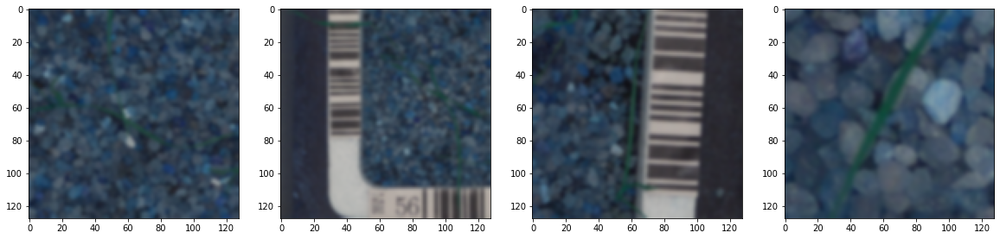

In [ ]:
# Looping through all seedling names and displaying the blurred images for each
for plant in labels["Label"].unique():
  showPlants(plant)

The above images show the Gaussian blurring performed correctly.

# 3. Making Data Compatible for Training

## One Hot Encoding

The image labels are currently strings (words).  We need to turn them into numbers for our model to be able to predict.  We will use one hot encoding for this.

In [ ]:
y = pd.get_dummies(labels.Label).astype("float32")  # Using pandas to one hot encode our image labels, coverting these into floating point decimal numbers for the tensorflow training below
y                                                   # Displaying the first and last 10 rows of images

,Black-grass,Charlock,Cleavers,Common Chickweed,Common wheat,Fat Hen,Loose Silky-bent,Maize,Scentless Mayweed,Shepherds Purse,Small-flowered Cranesbill,Sugar beet
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4745,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4746,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4747,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4748,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
codedLabels = dict(enumerate(y.columns))    # Storing the column names into a dictionary for reference after training
codedLabels

{0: 'Black-grass',
 1: 'Charlock',
 2: 'Cleavers',
 3: 'Common Chickweed',
 4: 'Common wheat',
 5: 'Fat Hen',
 6: 'Loose Silky-bent',
 7: 'Maize',
 8: 'Scentless Mayweed',
 9: 'Shepherds Purse',
 10: 'Small-flowered Cranesbill',
 11: 'Sugar beet'}

In [ ]:
y = y.values    # Storing the one hot encoded labels in a numpy array
y

array([[0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [ ]:
y[0]            # Displaying the first label row

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.], dtype=float32)

The above printout shows the array for the first seedling.  There is a one in the index 10 bin.  Referring to the dictionary printout above, 10 corresponds to a Small-flowered Cranesbill which is what the first seedling should be.

## Splitting into Training, Validation and Test Data

We want to split our data into three groups: training, validation and test.  We want 35% of our data to be training, 35% to be validation and 30% to be test data.

To do this we will first split our data into 30% test and 70% other.

In [ ]:
# Splitting into 30% actual test data and 70% "train" data that we will split below into the actual train data and validation data.
# We are stratifying our data so that train, validation and test will all have equal proportions of each seedling class.
x_train, x_test, y_train, y_test = train_test_split(blurredData, y, test_size=0.3, random_state=1, stratify=y)

In [ ]:
# Printing the shape of the test data
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

x_test shape: (1425, 128, 128, 3)
y_test shape: (1425, 12)


In [ ]:
# Splitting the rest of the data into equal parts training and validation.
# Again we are stratifying our data to have equal proportions of each seedling class.
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.5, random_state=1, stratify=y_train)

In [ ]:
# Printing the shape of our training data
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print()

# Printing the shape of our validation data
print("x_val shape:", x_val.shape)
print("y_val shape:", y_val.shape)

x_train shape: (1662, 128, 128, 3)
y_train shape: (1662, 12)

x_val shape: (1663, 128, 128, 3)
y_val shape: (1663, 12)


We now have 30% of our data in test, 35% in training and 35% in validation.

The shape of our data is perfectly compatible with Keras for training models.

In [ ]:
y_test[0]

array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32)

Above we see that y_test\[0\] corresponds to Black Grass since it has a one in the index zero bin.

In [ ]:
# Clearing up memory (RAM)
del blurredData
del blurredImage
del y

# 4. Building CNN

We will be using a grid search method to find the best model performance by tuning many of the various hyperparameters.  In order to utilize Keras' callbacks such as `EarlyStopping` and `ModelCheckpoint` we need to write our own grid search loop instead of using `GridSearchCV`.

### Function to create the CNN for the Grid Search Method

In [ ]:
# Custom function for building a CNN model based on different hyperparameters
def buildSequential(numConvLayers, unitsCNN, kSize, batchNormalization, convPool, dropout, globalPool, numDenseLayers, unitsANN):
  gridNN = Sequential()   # Initilizing a new model

  # Creating a number of convolutional layers equal to numConvLayers
  for i in np.arange(0, numConvLayers):

    # If we are on the first convolutional layer, the input shape needs to be equal to the shape of an image
    if i == 0:                           
      # Adding the very first convolutional layer, setting the input shape equal to the shape of an image
      # setting the number of kernels and the kernel size equal to the input values of our custom function
      gridNN.add(Conv2D(unitsCNN[i], kSize[i], padding="same", activation="relu", input_shape=x_train.shape[1:]))
    
    # If we are NOT on the first convolutional layer, the input shape need not be set
    # We just add a convolutional layer with the provided number of kernels and kernel size
    else:
      gridNN.add(Conv2D(unitsCNN[i], kSize[i], padding="same", activation="relu"))
    
    # If batchNormalization is true, we add a batch normalization layer
    if batchNormalization:
      gridNN.add(BatchNormalization())

    # If convPool is equal to Max we add a MaxPooling layer
    if convPool == "Max":
      gridNN.add(MaxPooling2D((2,2)))
    # If convPool is instead equal to Avg we add an AveragePooling layer
    else:
      gridNN.add(AveragePooling2D((2,2)))

    # Adding a dropout layer with the provided dropout rate
    gridNN.add(Dropout(dropout[i]))

    # End of convolutional layer creation

  # Now we add a layer which transforms our convolutional tensors into flattened arrays for the deep neural network layers.
  # If globalPool is equal to Max we add a GlobalMaxPooling layer
  if globalPool == "Max":
    gridNN.add(GlobalMaxPooling2D())

  # If globalPool is equal to Avg we add a GlobalAveragePooling layer
  elif globalPool == "Avg":
    gridNN.add(GlobalAveragePooling2D())
  
  # If globalPool is equal to Flat we add a basic Flatten layer
  else:
    gridNN.add(Flatten())
  
  # Creating a number of Dense layers equal to numDenseLayers
  for i in np.arange(0, numDenseLayers):
    # Adding a Dense layer with a number of neurons equal to number of units fed to our custom function
    gridNN.add(Dense(unitsANN[i], activation="relu"))
    # Adding a dropout layer with a rate of 0.5 to help control overfitting
    gridNN.add(Dropout(0.5))

  # Adding the final layer which has a number of neurons equal to the number of different seedlings, in this case 12
  # Using softmax to calculate the probablity the input image is each class
  gridNN.add(Dense(12, activation="softmax"))

  # Adding the adam optimizer to our model
  # Using categorical crossentropy for our loss since we have more than two classes
  gridNN.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

  # Returning the CNN model contructed based on inputed hyperparameter values
  return gridNN

# 5. Fit and Model Evaluation

## Grid Search Parameters

Grid search is a time intensive process.  The more hyperparameters which are tuned and the greater the number of options we give for each hyperparameter the more combinations we have to train.  Below we have chosen to tune some of the hyperparameters yielding 96 different combinations to train with.

In [ ]:
# Setting the options for the number of convolutional layers
numConvLayers = [3, 4]

# The options for the number of kernels in each convolutional layer
# Even though each array has four different kernel numbers, only the first 3 are used if there are only 4 convolutional layers
unitsCNN = [[32, 64, 64, 64],
            [16, 32, 32, 32]]

# The options for the size of the kernels in each convolutional layer
# Only the first three sizes of each array are used if the number of convolutional layers is three
kSize = [[(5,5), (5,5), (3,3), (3,3), (3,3)],
         [(3,3), (3,3), (3,3), (3,3), (3,3)],
         [(5,5), (5,5), (5,5), (5,5), (5,5)]]

# We are always using batch normalization
batchNormalization = [True]

# The optionas for the pooling layer after each convolutional layer
convPool = ["Max", "Avg"]

# We are not tuning the dropout rates for the convolutional layers
dropout = [[0.2, 0.3, 0.4, 0.5, 0.5]]

# We are not tuning the global pooling layer
globalPool = ["Max"]

# The options for the number of dense layers
numDenseLayers = [1, 2]

# The options for the number of neurons in each dense layer
unitsANN = [[256, 256],
            [256, 128]]

## Fitting Model

We now will loop through the different combinations of hyperparameters and fit the model.  We will also employ two Keras callbacks:
- EarlyStopping: stops the training process when the current model has not improved for a given number of epochs
- ModelCheckpoint: saves the best version of the current model at each epoch

In [ ]:
i = 0                 # Initializing a counter to number the current model
bestValLoss = 100     # Initializing the current "best" validation loss really high so any model will be performing better than it

# Looping through the different hyperparameter options given above, fitting the model with each combination
for nc in numConvLayers:
  for uc in unitsCNN:
    for ks in kSize:
      for bn in batchNormalization:
        for cp in convPool:
          for dp in dropout:
            for gp in globalPool:
              for nd in numDenseLayers:
                for ua in unitsANN:
                  # Building the current model with a combination of hyperparameters using our custom function
                  model = buildSequential(nc, uc, ks, bn, cp, dp, gp, nd, ua)

                  # Setting the early stopping callback to stop training when the validation loss has not improved after 10 epochs
                  early_stopping = EarlyStopping(monitor="val_loss", min_delta=0.001, patience=10)

                  # Setting the model checkpoint to save the weights of the current model when the validation loss has improved
                  model_checkpoint = ModelCheckpoint(filepath= "model_" + str(i) + ".h5",
                                     monitor = "val_loss",
                                     verbose = 0,
                                     save_best_only = True,
                                     save_weights_only = True,
                                     mode = "auto",
                                     save_freq = "epoch")

                  # Training the model with 32 batches and 100 epochs
                  # The training will probably stop each time before 100 epochs based on the early stopping callback
                  # Using x_val and y_val as the validation data
                  model.fit(x = x_train,
                            y = y_train,
                            batch_size=32,
                            epochs=100,
                            verbose=0,
                            validation_data=(x_val, y_val),
                            callbacks=[early_stopping, model_checkpoint])
                  
                  # Loading the weights of the current model saved from its best version
                  # The best version of the current model has the lowest validation loss
                  model.load_weights(filepath="model_" + str(i) + ".h5")
                  
                  # Calculating the validation loss and accuracy for the best version of the current model
                  valLoss, valAcc = model.evaluate(x=x_val, y=y_val)

                  # If the validation loss of the current model is better than all other previous models...
                  if valLoss < bestValLoss:
                    bestModelNumber = i                                     # Store the current model number
                    bestValLoss = valLoss                                   # Store the current model validation score as the best
                    bestParameters = [nc, uc, ks, bn, cp, dp, gp, nd, ua]   # Store the current model hyperparameters as the best
                    bestModel = model                                       # Store the current model as the best

                  # Displaying the finished model number and it's validation loss and accuracy
                  print("Model", i, " finished with validation loss of", valLoss, "and validation accuracy of", valAcc)

                  # Increasing the model number by one for the next model
                  i += 1

                  # Clearing up memory (RAM)
                  backend.clear_session()

52/52 [==============================] - 1s 10ms/step - loss: 0.5603 - accuracy: 0.8196
Model 0  finished with validation loss of 0.5603018999099731 and validation accuracy of 0.8196031451225281
52/52 [==============================] - 1s 11ms/step - loss: 0.5374 - accuracy: 0.8334
Model 1  finished with validation loss of 0.5374382138252258 and validation accuracy of 0.8334335684776306
52/52 [==============================] - 1s 11ms/step - loss: 0.8452 - accuracy: 0.7372
Model 2  finished with validation loss of 0.8452275991439819 and validation accuracy of 0.737221896648407
52/52 [==============================] - 1s 11ms/step - loss: 0.8689 - accuracy: 0.7246
Model 3  finished with validation loss of 0.8688512444496155 and validation accuracy of 0.7245941162109375
52/52 [==============================] - 1s 10ms/step - loss: 2.5061 - accuracy: 0.0577
Model 4  finished with validation loss of 2.5060760974884033 and validation accuracy of 0.05772699788212776
52/52 [==================

In [ ]:
# Printing which model performed best
print("Best Model Number:", bestModelNumber)
print("Best Model Validation Loss", bestValLoss)

Best Model Number: 16
Best Model Validation Loss 0.4775502681732178


In [ ]:
# Printing the best parameters
bestParameters

[3,
 [32, 64, 64, 64],
 [(5, 5), (5, 5), (5, 5), (5, 5), (5, 5)],
 True,
 'Max',
 [0.2, 0.3, 0.4, 0.5, 0.5],
 'Max',
 1,
 [256, 256]]

The best model has the following hyperparameters:
- Convolution layers: 3
- Number of kernels: 32, 64, 64
- Size of kernels: 5x5 for all kernels
- Batch normalization was always used
- Max pooling layers were used in the convolution steps
- We did not test multiple dropout rates
- We did not test multiple global pooling layers
- Number of dense layers: 1
- Number of neurons in the dense layer: 256

In [ ]:
# Rebuilding the best model with the using the best parameters
bestModel = buildSequential(bestParameters[0],
                            bestParameters[1],
                            bestParameters[2],
                            bestParameters[3],
                            bestParameters[4],
                            bestParameters[5],
                            bestParameters[6],
                            bestParameters[7],
                            bestParameters[8],)

# Loading the weights for the best model that were saved by the checkpoint
bestModel.load_weights("model_16.h5")

In [ ]:
# Printing the best model's validation accuracy
print("Best Model Validation Accuracy:", bestModel.evaluate(x=x_val, y=y_val)[1])

52/52 [==============================] - 1s 11ms/step - loss: 0.4776 - accuracy: 0.8473
Best Model Validation Accuracy: 0.8472639918327332


The best model's validation accuracy is strong.  Next we will see if the model has generalized by checking it against the test data.

## Model Evaluation

In [ ]:
# Using the best model to predict the test set
y_pred = np.argmax(bestModel.predict(x=x_test), axis=1)
y_pred

array([ 6, 11,  0, ...,  6,  3,  5])

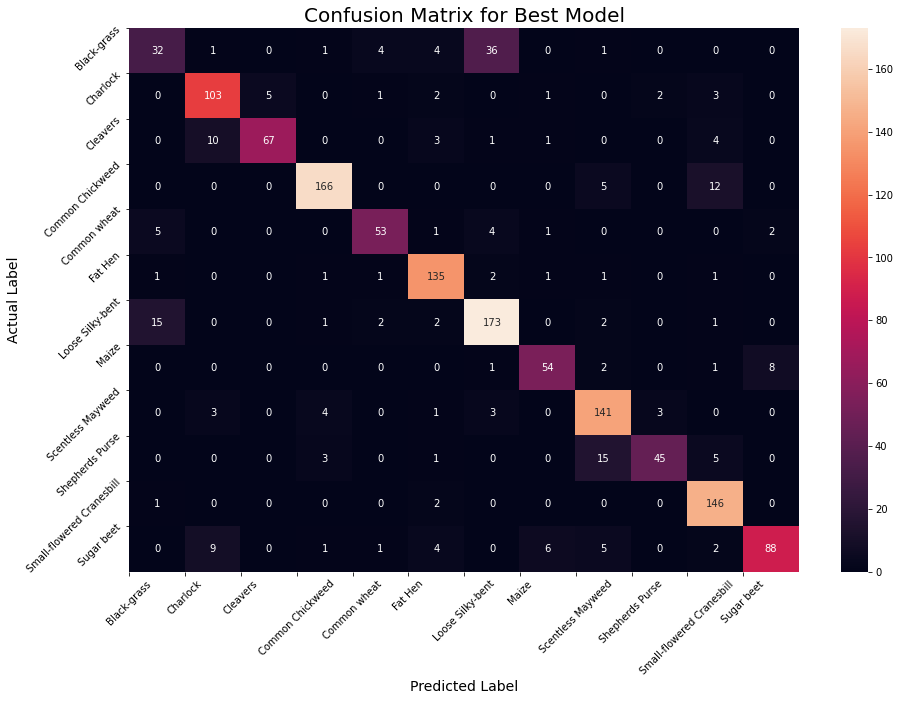

In [ ]:
# Creating a confusion matrix for the test data of our best model
cm = confusion_matrix(y_true=np.argmax(y_test, axis=1), y_pred=y_pred)

plt.figure(figsize=(15,10))                   # Increasing the size of the confusion matrix
sns.heatmap(data=cm, annot=True, fmt=".0f")   # Plotting the confusion matrix as a heatmap

plt.xlabel("Predicted Label", fontsize=14)    # Labeling the predicted axis
plt.ylabel("Actual Label", fontsize=14)       # Labeling the true axis

plt.xticks(ticks=np.arange(0,12), labels=list(codedLabels.values()), rotation=45)        # Placing the seedling names
plt.yticks(ticks=np.arange(0,12), labels=list(codedLabels.values()), rotation=45)        # Placing the seedling names

plt.title("Confusion Matrix for Best Model", fontsize=20)   # Adding a title
plt.show()

From the above confusion matrix:
- It is very apparent the model has the most difficulty in distiguishing `Loose Silky-bent` from `Black-grass`.
    - 15 times the model predicted the seedling was `Black-grass` when it was really `Loose Silky-bent`.
    - 36 times the model predicted the seedling was `Loose Silky-bent` when it was `Black-grass`.
- The model also has some trouble with `Scentless Mayweed` and `Shepherds Purse` along with a few others.
- Several of the seedlings the model almost perfectly predicts.

In [ ]:
# Printing the best model's test accuracy
print("Best Model Test Accuracy:", bestModel.evaluate(x=x_test, y=y_test)[1])

45/45 [==============================] - 1s 12ms/step - loss: 0.4897 - accuracy: 0.8442
Best Model Test Accuracy: 0.8442105054855347


The best model's test accuracy is nearly the same as the validation accuracy so our model is generalizing well.

In [ ]:
# Displaying the classification report with the test data
print(classification_report(y_true=np.argmax(y_test, axis=1), y_pred=y_pred))

              precision    recall  f1-score   support

           0       0.59      0.41      0.48        79
           1       0.82      0.88      0.85       117
           2       0.93      0.78      0.85        86
           3       0.94      0.91      0.92       183
           4       0.85      0.80      0.83        66
           5       0.87      0.94      0.91       143
           6       0.79      0.88      0.83       196
           7       0.84      0.82      0.83        66
           8       0.82      0.91      0.86       155
           9       0.90      0.65      0.76        69
          10       0.83      0.98      0.90       149
          11       0.90      0.76      0.82       116

    accuracy                           0.84      1425
   macro avg       0.84      0.81      0.82      1425
weighted avg       0.84      0.84      0.84      1425



From the above classification report we see:
- The F1 score for seedling 3 (`Common Chickweed`) shows the model performs best on it.
- The F1 scores for seedlings 1, 2, 3, 8 and 10 are all above the average of 0.84.
- Based on an F1 score of 0.48 the model performs worst on seedling 0 (`Black-grass`).

# 6. Visualizing Predictions


**Custom function to display prediction vs reality**

In [ ]:
# Custom function to display a given seedling image and the predicted probabilities the model had for the different classes
def predVsActual(idx):
  print("Predicted Class:", y_pred[idx], "or", codedLabels[y_pred[idx]])                                      # Prints the class the model predicts the image is
  print("Actual Class:", np.argmax(y_test[idx], axis=0), "or", codedLabels[np.argmax(y_test[idx], axis=0)])   # Prints the actual class of the image

  fig, axs = plt.subplots(1, 2, figsize=(10,4))                                                               # Sets up subplots

  axs[0].imshow(x_test[idx])                                                                                  # Displays the image of the seedling
  axs[0].title.set_text("Image " + str(idx) + ": " + codedLabels[np.argmax(y_test[idx], axis=0)])             # Displays the name of the seedling above the image

  sns.barplot(x=list(codedLabels.values()) ,y=model.predict(x_test)[idx], ax=axs[1])                          # Graphs the probability the model assigns of the image being in each class
  axs[1].title.set_text("Predicted Probablity of Each Class")                                                 # Titles the graph
  plt.xticks(rotation=-90)                                                                                     # Rotates the labels
  
  plt.show()

**Test image at index 2**

Predicted Class: 0 or Black-grass
Actual Class: 0 or Black-grass


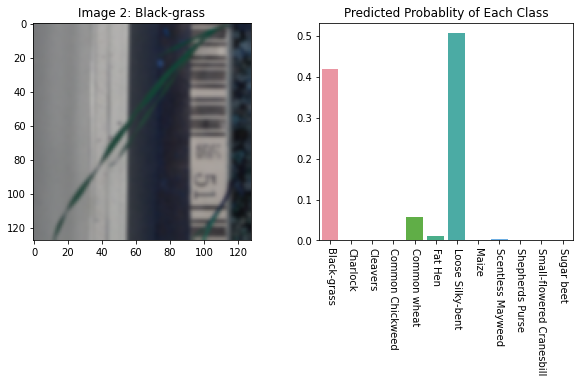

In [ ]:
predVsActual(2)

The model correctly predicted the seedling type in this case.  However, the probability plot shows the model gives a high probability to `Loose Silky-bent` as well.

**Test image at index 3**

Predicted Class: 11 or Sugar beet
Actual Class: 11 or Sugar beet


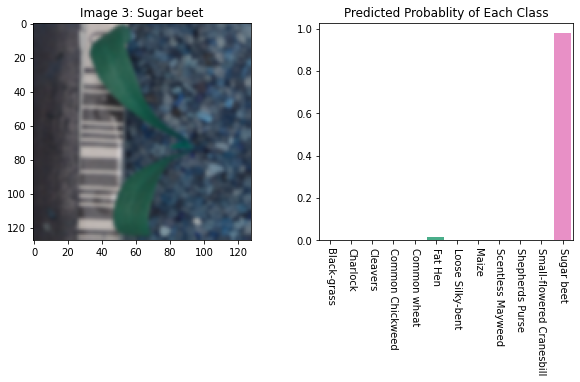

In [ ]:
predVsActual(3)

The model correctly predicted this seedling type with a very high degree of certainty.

**Test image at index 33**

Predicted Class: 6 or Loose Silky-bent
Actual Class: 4 or Common wheat


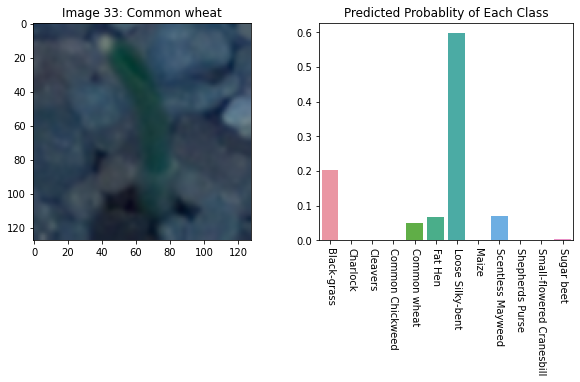

In [ ]:
predVsActual(33)

The model failed to correctly predict this seedling.  From the probability plot `Common Wheat` is the fifth highest probability.

**Test image at index 36**

Predicted Class: 6 or Loose Silky-bent
Actual Class: 6 or Loose Silky-bent


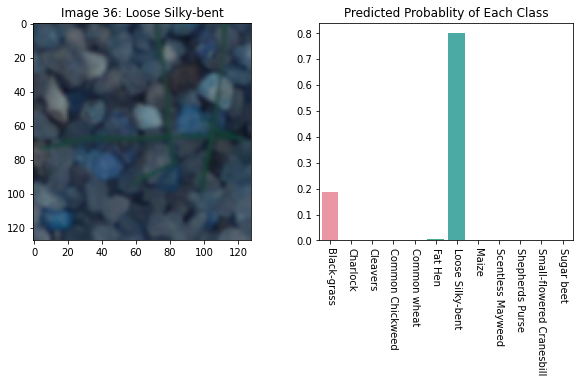

In [ ]:
predVsActual(36)

The model correctly identified this seedling with a high degree of certainty.

**Test image at index 59**

Predicted Class: 0 or Black-grass
Actual Class: 0 or Black-grass


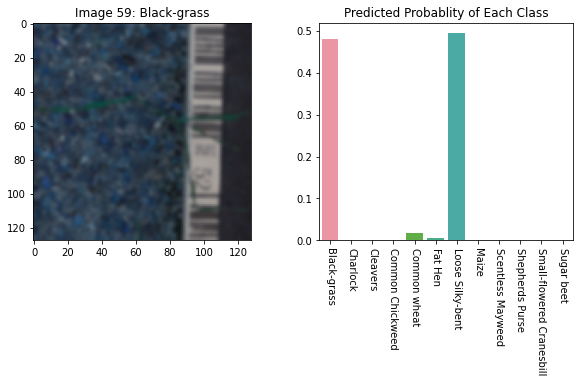

In [ ]:
predVsActual(59)

The model correctly identified this seedling, though with a low degree of certainty.

## Conclusion

Overall the model performs well however it struggles greatly with identifying `Black-grass`.